# Машинное обучение, ФКН ВШЭ

# Практическое задание 5

## Общая информация

Дата выдачи: 26.02.2017

Срок сдачи: 23:59MSK 12.03.2017

### О задании

Практическое задание 5 посвящено использованию ядер в методах машинного обучения. В рамках данного задания вы:
 * исследуете вид разделяющих поверхностей в исходном пространстве в зависимости от типа используемов ядра и значений его параметров;
 * используете ядра для решения реальной задачи;
 * реализуете пользовательское ядро для использования в ядровом SVM;
 * используете аппроксимации ядер;
 * поймёте, почему ядра — это не всегда хорошо.

### Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце Вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник). 

Неэффективная реализация кода может негативно отразиться на оценке.


### Формат сдачи
Для сдачи задания переименуйте получившийся файл \*.ipynb в соответствии со следующим форматом: *HW5_Username.ipynb*, где *Username* — Ваша фамилия и инициалы на латинице (например, *HW5_IvanovII.ipynb*). Далее отправьте этот файл на hse.cs.ml+<номер группы>@gmail.com (например, hse.cs.ml+141@gmail.com для студентов группы БПМИ-141).

## Ядровой SVM

**1. (0 баллов)** Сгенерируйте три случайные двумерные выборки для бинарной классификации (хотя бы по 400 точек в каждой):
- с линейно разделимыми классами;
- с хорошо разделимыми классами, но не линейно разделимыми;
- с плохо разделимыми классами.

Визуализируйте полученные выборки на плоскости.

Для генерации случайной выборки можно использовать функции из модуля [sklearn.datasets](http://scikit-learn.org/stable/modules/classes.html#module-sklearn.datasets).

In [185]:
import matplotlib.pyplot as plt

from sklearn.datasets import make_classification
from sklearn.datasets import make_blobs
from sklearn.datasets import make_gaussian_quantiles
from sklearn.datasets import make_circles

%pylab inline

X1, Y1 = X, Y = make_blobs(n_samples=400, centers=2, random_state=0, cluster_std=0.60)

X2, Y2 = make_circles(n_samples=400, factor=.3, noise=.05, random_state=42)

X3, Y3 = make_classification(n_samples=400, n_features=2, n_redundant=0, n_informative=2, random_state=43)


Populating the interactive namespace from numpy and matplotlib


/root/anaconda3/envs/mxnet2/lib/python2.7/site-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['colors', 'clf']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


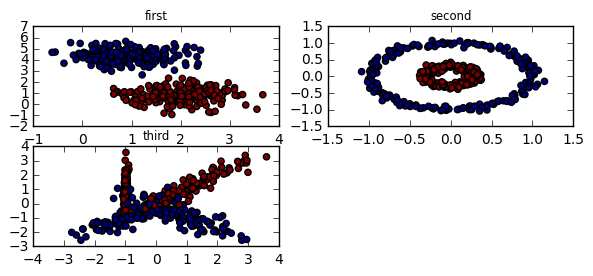

In [186]:
plt.subplots_adjust(bottom=.05, top=.9, left=.05, right=.95)

plt.subplot(321)
plt.title("first", fontsize='small')

plt.scatter(X1[:, 0], X1[:, 1], c=Y1, s=20)

plt.subplot(322)
plt.title("second", fontsize='small')
plt.scatter(X2[:, 0], X2[:, 1], c=Y2, s=20)
#plt.scatter(X2[:, 0], X2[:, 1], marker='o', c=Y1)

plt.subplot(323)
plt.title("third", fontsize='small')

plt.scatter(X3[:, 0], X3[:, 1], c=Y3, s=20)

plt.show()

В [лекции 13](https://github.com/esokolov/ml-course-hse/blob/master/2016-fall/lecture-notes/lecture13-features.pdf) была сформулирована двойственная задача метода опорных векторов:
$$\begin{cases}
\sum_{i=1}^l \lambda_i - \frac{1}{2} \sum_{i, \, j =1}^l \lambda_i \lambda_j y_i y_j \langle x_i, x_j\rangle \to \max_\lambda,\\
0 \le \lambda_i \le C, i = \overline{1, l},\\
\sum_{i=1}^l \lambda_i y_i = 0.
\end{cases}$$

После решения данной задачи прогнозы для новых объектов строятся следующим образом: $a(x) = \text{sign} \left( \sum_{i=1}^l \lambda_i y_i \langle x_i, x \rangle + b \right).$

Заметим, что и оптимизационная задача, и формула итогового классификатора зависят лишь от скалярных произведений объектов, а потому в данном методе можно использовать ядра для восстановления нелинейных зависимостей.

**2. (1.5 балла)** Обучите на сгенерированных ранее двумерных выборках [ядровой SVM](http://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html) с использованием следующих типов ядер (для различных значений гиперпараметра $C$):
- линейное: $K(x, z) = \langle x, z \rangle$;
- полиномиальное: $K(x, z) = (\gamma \langle x, z \rangle + 1)^d$ (для различных значений $\gamma, d$);
- гауссовское: $K(x, z) = \exp(-\gamma \|x - z\|^2)$ (для различных значений $\gamma$).

Визуализируйте разделяющую поверхность и разделяющую полосу:
 - для модели с линейным ядром для различных значений $C$;
 - для моделей, использующих полиномиальное и гауссовское ядро, соответствующих недообучению, нормальному поведению и переобучению

In [ ]:
from sklearn.svm import SVC

X = X1
y = Y1

def plt_res(cl, X, y, title, i = 0):
    # взято с сайтика sklean
    h = 0.2
    clf.fit(X, y)
    plt.figure(i)
    plt.clf()
    plt.scatter(X[:, 0], X[:, 1], c=y, zorder=10, cmap=plt.cm.Paired)

    plt.axis('tight')
    x_min = X[:, 0].min()
    x_max = X[:, 0].max()
    y_min = X[:, 1].min()
    y_max = X[:, 1].max()

    XX, YY = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))
    Z = clf.decision_function(np.c_[XX.ravel(), YY.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(XX.shape)
    plt.pcolormesh(XX, YY, Z > 0, cmap=plt.cm.Paired)
    plt.contour(XX, YY, Z, colors=['k', 'k', 'k'], linestyles=['--', '-', '--'],
                levels=[-.5, 0, .5])

    plt.title(title)
    plt.show()

    
i = 0
for (X, y) in [(X1, Y1), (X2, Y2), (X3, Y3)]:
    # linear svc
    for C in [0.1, 1, 1.5]:
        clf = SVC(C=C, kernel='linear')
        plt_res(clf, X, y, "linear SVC with C=%f" % C, i)
        i += 1


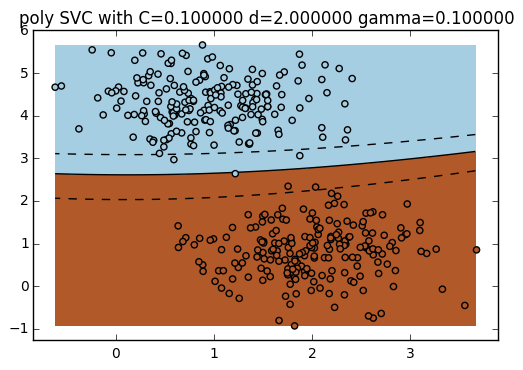

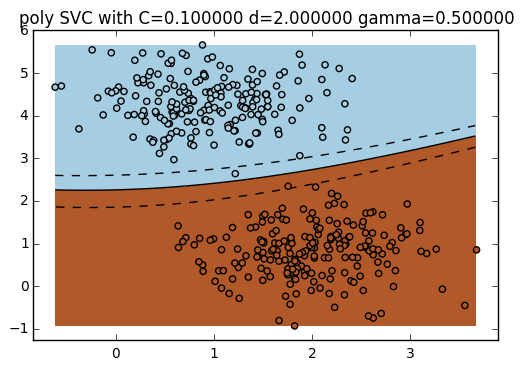

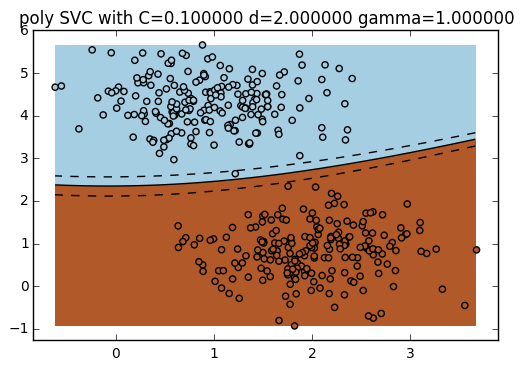

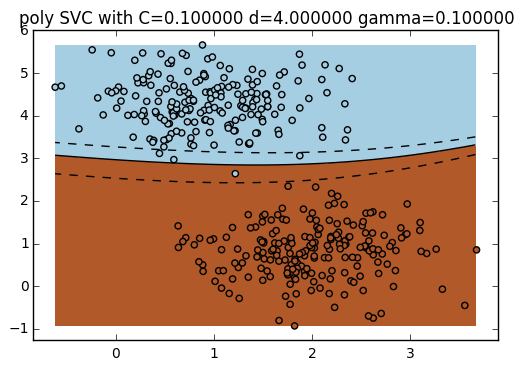

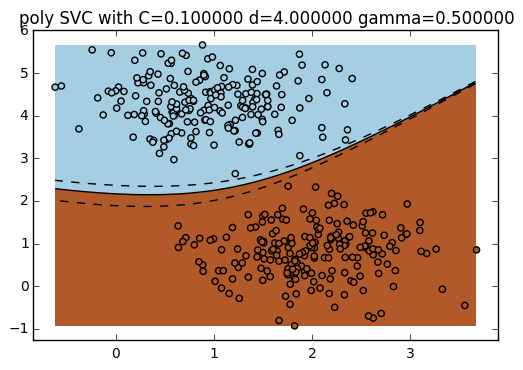

...

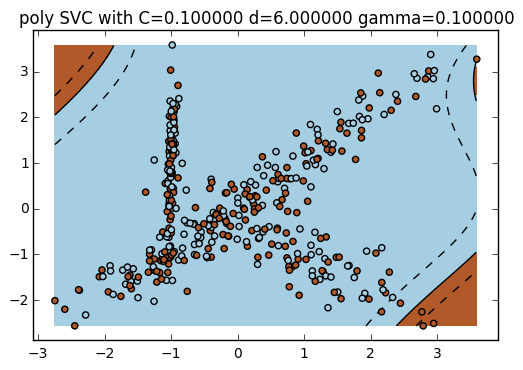

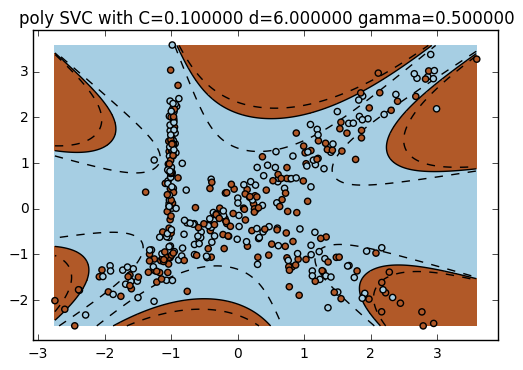

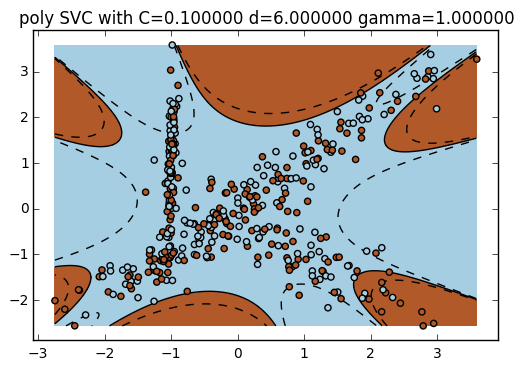

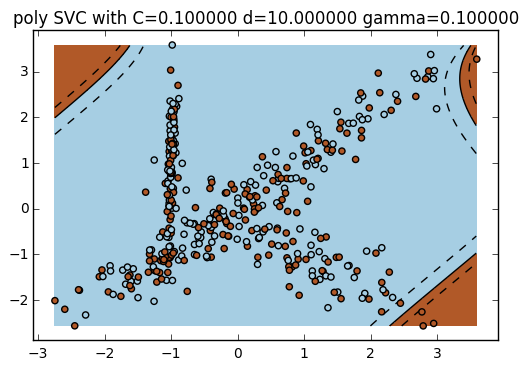

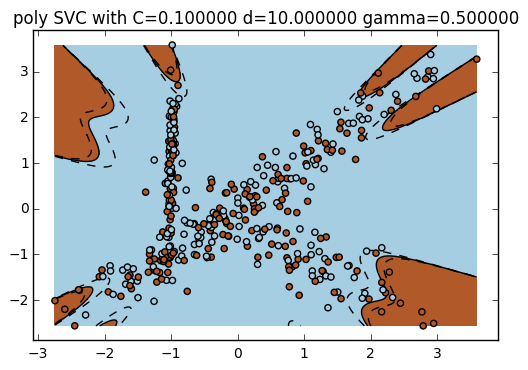

KeyboardInterrupt: 

In [94]:
for (X, y) in [(X1, Y1), (X2, Y2), (X3, Y3)]:
    # poily svc
    for C in [0.1, 1, 1.5]:
        for d in [2,4,6,10]:
            for g in [0.1, 0.5, 1]:
                clf = SVC(C=C, kernel='poly', gamma=g, degree=d)
                plt_res(clf, X, y, "poly SVC with C=%f d=%f gamma=%f" % (C, d, g))


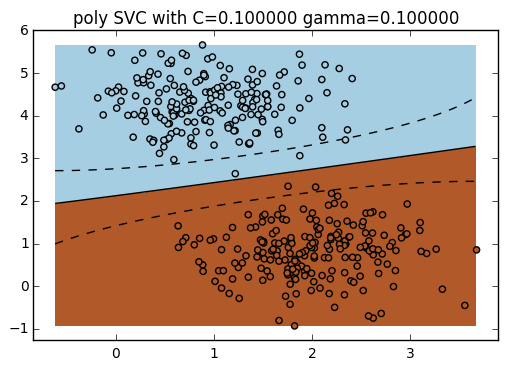

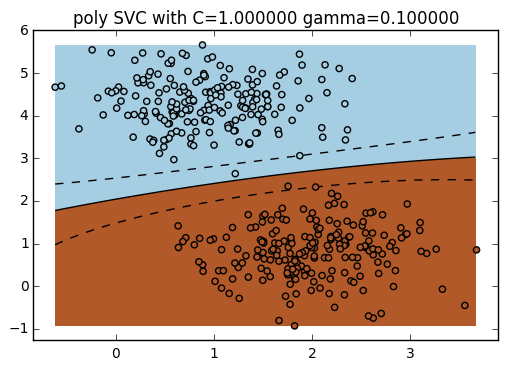

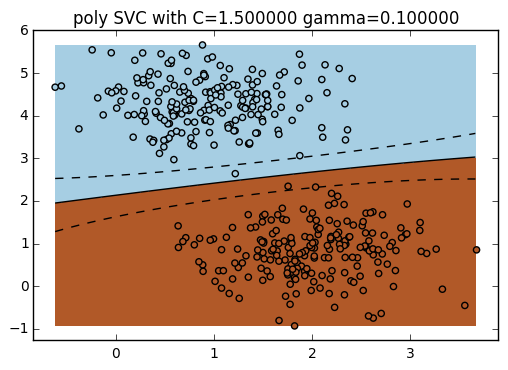

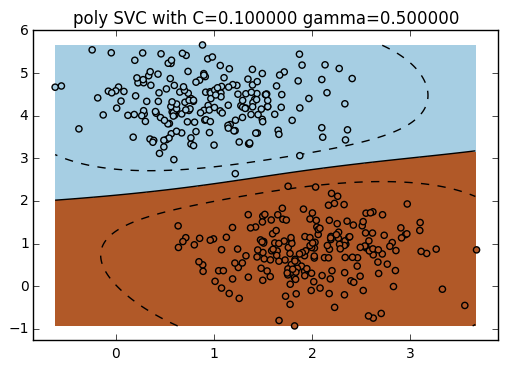

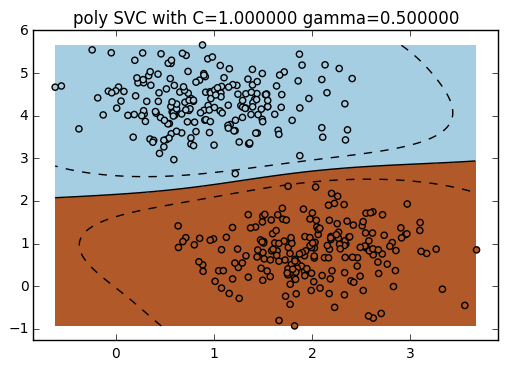

...

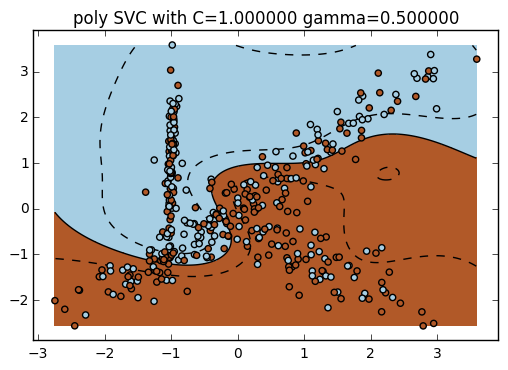

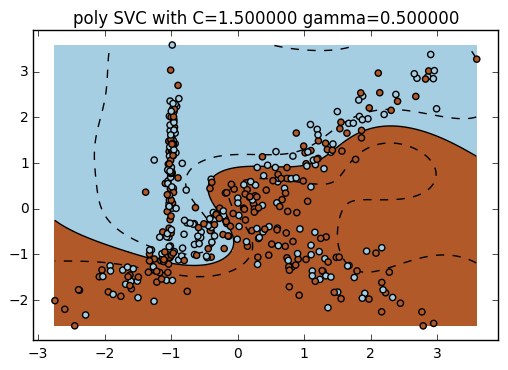

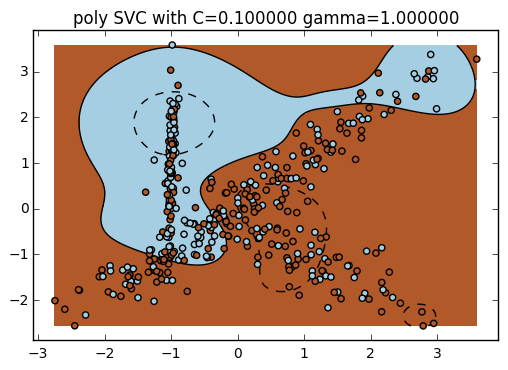

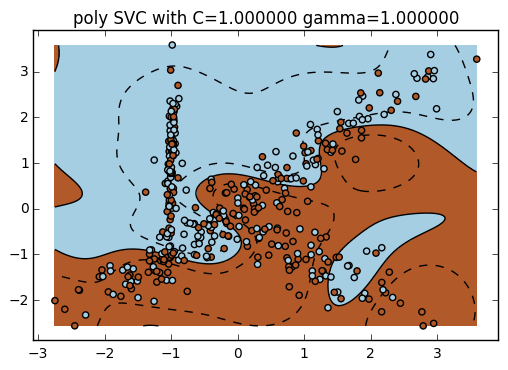

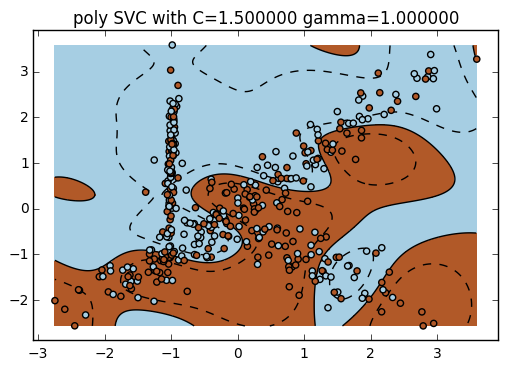

In [96]:
for (X, y) in [(X1, Y1), (X2, Y2), (X3, Y3)]:
    # rbf svc
    for g in [0.1, 0.5, 1]:
        for C in [0.1, 1, 1.5]:
            clf = SVC(C=C, kernel='rbf', gamma=g, degree=d)
            plt_res(clf, X, y, "poly SVC with C=%f gamma=%f" % (C, g))


**3. (0.5 балла)** Ответьте на следующие вопросы:
 - Как ведет себя SVM с полиномиальным ядром в зависимости от значений гиперпараметра $C$, степени ядра $d$ и параметра $\gamma$?
 - Как ведет себя SVM с гауссовским ядром в зависимости от значений гиперпараметра $C$ и $\gamma$?

**Ответ:**

1. Зависимость от C не заметна, при увеличении d происходит переобучение, с увлечением гамма разделение выборок улучшается.

2. При увеличении C и gamma разделяющая кривая все сильнее пытается подогнуаться под выборку -- переобучение. 
   

**4. (0.5 балла)** Обучите модели с использованием ядер из п. 2 для задачи бинарной классификации [Predicting a Biological Response](https://www.kaggle.com/c/bioresponse) (используйте файл train.csv) для значения $C=1.$ Для оценки качества разбейте выборку на обучающую и тестовую в отношении 50/50. Постройте модель, позволяющую достичь значения accuracy, равного 0.75, на тестовой выборке. Позволяет ли использование ядер достичь лучшего качества по сравнению с линейной моделью?

In [193]:
import pandas as pd

df = pd.read_csv('train.csv', sep=',')
Y = df['Activity']
X = df.drop('Activity', axis=1)

In [194]:
from sklearn.cross_validation import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.50, random_state=42)

In [199]:
clf = SVC(kernel='linear').fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(accuracy_score(y_test, y_pred))

0.733475479744


In [ ]:
from sklearn.metrics import accuracy_score
#poily svc
for d in [1,2,3,4,5]:
    for g in [0.05, 0.1, 0.3, 0.5, 0.7, 0.9, 1, 1.5]:
        clf = SVC(kernel='poly', gamma=g, degree=d).fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        print(accuracy_score(y_test, y_pred))
        print("poly SVC with d=%f gamma=%f" % (d, g))

0.768123667377
poly SVC with d=1.000000 gamma=0.050000
0.758528784648
poly SVC with d=1.000000 gamma=0.100000
0.752132196162
poly SVC with d=1.000000 gamma=0.300000
0.745202558635
poly SVC with d=1.000000 gamma=0.500000
0.740405117271
poly SVC with d=1.000000 gamma=0.700000
0.732942430704
poly SVC with d=1.000000 gamma=0.900000
0.733475479744
poly SVC with d=1.000000 gamma=1.000000
0.730810234542
poly SVC with d=1.000000 gamma=1.500000
0.75
poly SVC with d=2.000000 gamma=0.050000
0.732409381663
poly SVC with d=2.000000 gamma=0.100000
0.728144989339
poly SVC with d=2.000000 gamma=0.300000
0.72921108742
poly SVC with d=2.000000 gamma=0.500000
0.731343283582
poly SVC with d=2.000000 gamma=0.700000
0.731343283582
poly SVC with d=2.000000 gamma=0.900000
0.731343283582
poly SVC with d=2.000000 gamma=1.000000
0.731343283582
poly SVC with d=2.000000 gamma=1.500000
0.740938166311
poly SVC with d=3.000000 gamma=0.050000
0.730277185501
poly SVC with d=3.000000 gamma=0.100000
0.72921108742
poly SV

In [200]:
# rbf svc
for g in [0.01, 0.001, 0.1, 0.3, 0.5, 0.7, 0.9, 1, 1.5]:
    clf = SVC(kernel='rbf', gamma=g).fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print(accuracy_score(y_test, y_pred))
    print("rbf SVC with gamma=%f" % g)

0.77132196162
rbf SVC with gamma=0.010000
0.72921108742
rbf SVC with gamma=0.001000
0.705756929638
rbf SVC with gamma=0.100000
0.651385927505
rbf SVC with gamma=0.300000
0.618869936034
rbf SVC with gamma=0.500000
0.609275053305
rbf SVC with gamma=0.700000
0.597547974414
rbf SVC with gamma=0.900000
0.592217484009
rbf SVC with gamma=1.000000
0.577292110874
rbf SVC with gamma=1.500000


**Ответ:** Использование ядер позволяет достичь лучшего качества по сравнению с линейной моделью.

0.75
poly SVC with d=2.000000 gamma=0.050000

## Аппроксимации ядер

К сожалению, использование ядер, особенно при больших размерах выборок, как правило, значительно увеличивает сложность процедуры обучения модели. Для решения этой проблемы используется аппроксимация спрямляющего пространства — в частности, в рамках курса рассматривались [метод Нистрома](http://scikit-learn.org/stable/modules/generated/sklearn.kernel_approximation.Nystroem.html#sklearn.kernel_approximation.Nystroem) и [метод случайных признаков Фурье](http://scikit-learn.org/stable/modules/generated/sklearn.kernel_approximation.RBFSampler.html#sklearn.kernel_approximation.RBFSampler).

**5. (2 балла)** Модифицируйте модель с использованием ядра из п. 4 путём аппроксимаций ядер, реализованных в модуле [sklearn.kernel_approximation](http://scikit-learn.org/stable/modules/classes.html#module-sklearn.kernel_approximation). Постройте график зависимости accuracy на тестовой выборке в зависимости от значения параметра n_components, используемого при аппроксимации. Какие выводы можно сделать?

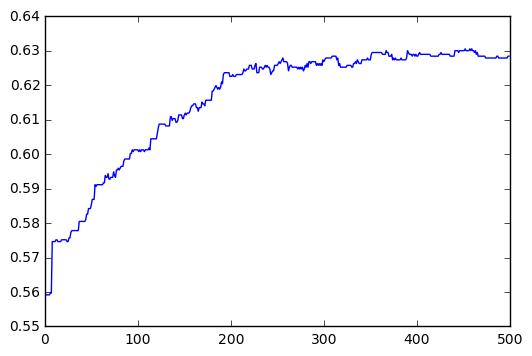

In [212]:
from sklearn.kernel_approximation import Nystroem
from sklearn import datasets, svm, pipeline


# взято с сайтика sklean

sample_sizes = np.arange(1, 500)

feature_map_nystroem = Nystroem(gamma=.01)
nystroemc_approx_svm = pipeline.Pipeline([("feature_map", feature_map_nystroem),
                                        ("svm", svm.LinearSVC())])

nystroem_scores = []

for D in sample_sizes:
    nystroem_approx_svm.set_params(feature_map__n_components=D)
    nystroem_approx_svm.fit(X_train, y_train)

    nystroem_score = nystroem_approx_svm.score(X_test, y_test)
    nystroem_scores.append(nystroem_score)  
    
plt.plot(sample_sizes, nystroem_scores)

plt.show()

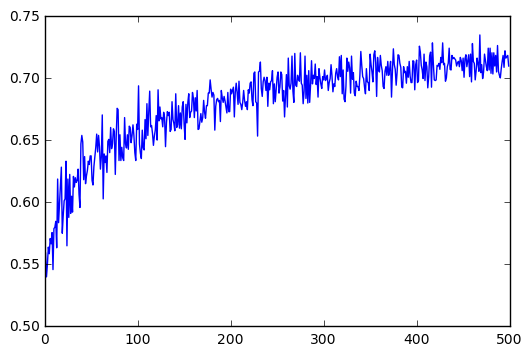

In [216]:
from sklearn.kernel_approximation import RBFSampler
from sklearn import datasets, svm, pipeline


sample_sizes = np.arange(1, 500)

feature_map_rbf = RBFSampler(gamma=.01)
rbf_approx_svm = pipeline.Pipeline([("feature_map", feature_map_rbf),
                                        ("svm", svm.LinearSVC())])

rbf_scores = []

for D in sample_sizes:
    rbf_approx_svm.set_params(feature_map__n_components=D)
    rbf_approx_svm.fit(X_train, y_train)

    rbf_score = rbf_approx_svm.score(X_test, y_test)
    rbf_scores.append(rbf_score)  
    
plt.plot(sample_sizes, rbf_scores)

plt.show()

при росте n_components растет качество модели но потом оно стабилизируется 

## All-subsequences kernel

Попробуем при помощи ядрового SVM с использованием all-subsequences-kernel (описано в [материалах семинара 14](https://github.com/esokolov/ml-course-hse/blob/master/2016-spring/seminars/sem14-kernels.pdf)) решить задачу [20newsgroups](http://scikit-learn.org/stable/datasets/twenty_newsgroups.html) классификации текстов статей по темам.

**6. (0 баллов)** Загрузите двухклассовую обучающую и тестовую выборки (используя параметр subset функции [fetch_20newsgroups](http://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_20newsgroups.html#sklearn.datasets.fetch_20newsgroups)) для категорий rec.autos и soc.religion.christian со следующими значениями параметров:
    * shuffle=True;
    * random_state=1;
    * remove=('headers', 'footers', 'quotes').
Загрузите выборки таким образом, чтобы целевая переменная принимала значения $\pm1$.

In [259]:
from sklearn.datasets import fetch_20newsgroups

categories = ['rec.autos', 'soc.religion.christian']
train = fetch_20newsgroups(random_state=1,
                           subset='train',
                           categories=categories,
                           shuffle=True,
                           remove=('headers', 'footers', 'quotes')
                           )

test = fetch_20newsgroups(random_state=1,
                           subset='test',
                           categories=categories,
                           shuffle=True,
                           remove=('headers', 'footers', 'quotes')
                           )

In [260]:
train.keys()

['DESCR', 'data', 'target', 'target_names', 'filenames']

In [261]:
train.target[train.target == 0] = -1
test.target[test.target == 0] = -1

К сожалению, для корректной работы sklearn.SVC с использованием пользовательского ядра необходимо, чтобы объекты являлись числовыми векторами, что не выполняется для необходимого ядра.

**7. (0.5 балла)** Преобразуйте матрицы объект-признак обучающей и контрольной выборок следующим образом:
 * удалите все символы, кроме букв и пробельных символов;
 * приведите все буквы к нижнему регистру;
 * разбейте текст на токены по пробельным символам;
 * удалите токены длиной $\le 3$ символов;
 * закодируйте каждый объект выборки последовательностью **номеров** токенов в некотором "словаре", состоящем из всех токенов, встречающихся в обучающей выборке; для каждого текста кодируйте 30 первых токенов.
 
Способ кодирования токенов тестовой выборки, не встречающихся в обучающей, а также способ кодирования объектов, состоящих из менее чем 30 токенов, остаётся на ваше усмотрение, однако опишите, как именно были решены эти проблемы.

In [262]:
import re

words = {}
reverse = {}
i = 0

for i in range(len(train['data'])):
    train['data'][i] = re.sub(r'[^\w]', ' ',  train['data'][i])
    train['data'][i] = re.sub(r'\s+', ' ',  train['data'][i])
    train['data'][i] = train['data'][i].lower()
    for w in train['data'][i].split(' '):
        if len(w) > 3:
            if w not in words:
                words[w] = i
                reverse[i] = w
                i += 1
for i in range(len(test['data'])):         
    test['data'][i] = re.sub(r'[^\w]', ' ',  test['data'][i])
    test['data'][i] = re.sub(r'\s+', ' ',  test['data'][i])
    test['data'][i] = test['data'][i].lower()
    for w in test['data'][i].split(' '):
        if len(w) > 3:
            if w not in words:
                words[w] = i
                reverse[i] = w
                i += 1
                
            
for i in range(len(train['data'])):
    new_data = []
    for w in train['data'][i].split(' '):
        if len(w) > 3:
            new_data.append(words[w])
    train['data'][i] = np.array(new_data)
    
for i in range(len(test['data'])):
    new_data = []
    for w in test['data'][i].split(' '):
        if len(w) > 3:
            new_data.append(words[w])
    test['data'][i] = np.array(new_data)

In [263]:
for i in range(len(train['data'])):
    train['data'][i] = train['data'][i][:30]

for i in range(len(test['data'])):
    test['data'][i] = test['data'][i][:30]

     
    
train['data'][0]

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13,  3, 14, 15,
       16, 17,  2,  3, 18, 19, 20, 21, 22, 23, 24, 25, 26])

**8. (1 балл)** Реализуйте функцию, принимающую в качестве параметров 2 строки x и z, и возвращающую значение all-subsequences-kernel для этих строк.

In [247]:
def all_subseq_kernel(x, z):
    res = 0
    for i in x:
        for j in z:
            if i == j:
                res += 1
    return res

**9. (0.5 балла)** Реализуйте функцию, которая принимает в качестве параметров 2 выборки $\{x_i\}_{i=1}^l$ и $\{z_j\}_{j=1}^n$, закодированные описанным ранее способом, а также используемый словарь токенов, и возвращает матрицу $K = (K_{ij})_{i, j=1}^{l, n},$ где $K_{ij} = \text{all_subseq_kernel}(x_i, z_j).$

Для выполнения данного задания можно использовать функцию [sklearn.metrics.pairwise.pairwise_kernels](http://scikit-learn.org/stable/modules/generated/sklearn.metrics.pairwise.pairwise_kernels.html).

In [248]:
def all_subseq_kernel_matrix(X, Z):
    res = []
    print(X.shape)
    print(Z.shape)
    for x in X:
        row = []
        for z in Z:
            row.append(all_subseq_kernel(reverse[x], reverse[z]))
        res.append(row)
    return res

**10. (0.5 балла)** Обучите SVM с параметрами по умолчанию с использованием all-subsequences-kernel на обучающей выборке и выведите значение accuracy на тестовой. В случае вычислительных проблем используйте матрицы Грама для обучения и теста, сохраненные в файлах homework-practice-05-train-kernel-matrix.csv и homework-practice-05-test-kernel-matrix.csv соответственно. Обратите внимание, что значения ядра для полученных текстов довольно велики в силу их длины, что может повлечь численные проблемы в процессе обучения модели. Поэтому рекомендуется вместо исходного рассматривать нормированное ядро $\tilde{K}(x, z) = \langle \frac{\phi(x)}{\| \phi(x) \|}, \frac{\phi(z)}{\| \phi(z) \|} \rangle.$ Перейти к нему можно с использованием значений диагональных элементов соответствующих матриц Грама.

In [249]:
from sklearn import datasets, svm, pipeline

clf = svm.SVC(kernel=all_subseq_kernel_matrix)

clf.fit(train['data'], train['target'])

rbf_score = clf.score(train['data'], train['target'])
print(rbf_score)  

ValueError: setting an array element with a sequence.

Иногда в случае больших размеров обучающих выборок используют метод, схожий с аппроксимациями ядер. После решения двойственной задачи ядрового SVM прогноз для нового объекта вычисляется следующим образом:
$$a(x) = sign \left( \sum_{j=1}^l \lambda_j y_j K(x_j, x) + b \right).$$

Такое представление позволяет поставить и решить несколько другую задачу. Пусть параметрами модели являются переменные $\lambda_1, \dots, \lambda_l, b$ — в этом случае можно построить линейный классификатор на обучающей выборке в новом признаковом пространстве $Z = (z_{ij})_{i, j=1}^{l, l},$ где $z_{ij} = y_j K(x_i, x_j).$ При этом количество признаков в новом признаковом пространстве будет равно $l$, и каждый из них будет соответствовать некоторому объекту обучающей выборки, поэтому можно взять лишь произвольное подмножество из них.

**11. (0.5 балла)** Сформируйте обучающую и тестовую выборки в новом признаковом пространстве, как описано выше, обучите логистическую регрессию с параметрами по умолчанию и выведите значение accuracy на тестовой выборке. Постройте графики зависимости accuracy на тестовой выборке в зависимости от количества признаков в новом признаковом пространстве.

In [ ]:
# Your code here

**12. (1 балл)** Чем, на ваш взгляд, обусловлено такое низкое качество классификации для рассмотренных моделей при использовании all-subsequences-kernel? Какие шаги можно предпринять для улучшения качества?

**Ответ**:

**13. (1.5 балла)** Улучшите какую-либо модель из пп. 10-11 путём модификации выборки или подбора параметров модели таким образом, чтобы accuracy на той же обучающей выборке, что использовалась ранее, достигало значения 0.58. Опишите ваши изменения модели.

In [ ]:
# Your code here

**Ответ:**

**14. (3 доп. балла)** Реализуйте ядро, которое позволяет достичь значения accuracy на тестовой выборке, равного 0.7, при классификации при помощи ядрового SVM.

In [ ]:
# Your code here

Здесь вы можете поделиться своими мыслями по поводу этого задания

А здесь — вставить вашу любимую картинку.